# Importações

In [141]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [142]:
import os
import pickle
models_prefix = './models-persisted'

def persist_instance(variable:any, file_name:str):
    if not os.path.exists(models_prefix): os.makedirs(models_prefix)

    with open(f'{models_prefix}/{file_name}.pkl', 'wb') as file:
        pickle.dump(variable, file)

def load_instance(path:str):
    with open(f'{path}', 'rb') as file:
        return pickle.load(file)

# Leitura dos dados

In [143]:
from essayDataDiggestor import EssayDataDiggestor

data_path = '../data/collected_data'
data_diggestor = EssayDataDiggestor()

not_measured_by_sensor = ['PT100 3 [ºC]', 'PT100 4 [ºC]', 'Vel. do Ar [m/s]']
target_col = 'Umidade Média Produto [%]'

# Reading data from files
df_train = data_diggestor.get_labeled_essays(data_path)
df_essays = data_diggestor.get_essays(data_path)
df_measures = data_diggestor.get_labeled_essays(data_path, get_measures_flag=True)

# Removing columns not measured by sensors
df_train = df_train.drop(columns=not_measured_by_sensor).reset_index(drop=True)
df_essays = df_essays.drop(columns=not_measured_by_sensor).reset_index(drop=True)
df_measures = df_measures.drop(columns=not_measured_by_sensor).reset_index(drop=True)

print('DataFrame de treinamento')
display(df_train.head())
print('\n\nDataFrame com dados em tempo real do ensaio')
display(df_essays.head())

DataFrame de treinamento


,Time,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],Ensaio,Umidade Média Produto [%]
0,0.000,23.681101,23.626140,23.174812,57.704340,24.255182,73.746678,0,55.223333
1,899.564,27.150231,27.212689,24.787157,47.790284,28.432172,87.234795,0,48.006667
2,1798.938,26.887455,26.675792,26.097392,44.201039,26.974166,92.332055,0,41.003333
3,2700.298,26.897853,26.742584,27.033274,42.788991,26.882220,93.655657,0,7.083333
4,3601.595,43.864988,39.788933,27.676899,40.073266,36.175378,36.280460,0,2.283333




DataFrame com dados em tempo real do ensaio


,Time,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],Ensaio
0,0.000,23.681101,23.626140,23.174812,57.704340,24.255182,73.746678,0
1,3.253,23.681888,23.623464,22.944946,57.779871,24.288020,73.914167,0
2,6.655,23.675593,23.618114,23.158393,57.628810,24.333993,74.577554,0
3,9.884,23.666780,23.609773,23.164961,57.326689,24.383250,75.809093,0
4,13.184,23.649784,23.598442,22.987635,56.486007,24.376682,77.267243,0


In [144]:
df_measures = df_measures[
    [
        'Time',
        'Umidade Média Produto [%]',
        'Umidade 0 Produto [%]',
        'Umidade 1 Produto [%]',
        'Umidade 2 Produto [%]',
        'Ensaio'
    ]
]

df_measures.head()

,Time,Umidade Média Produto [%],Umidade 0 Produto [%],Umidade 1 Produto [%],Umidade 2 Produto [%],Ensaio
0,0.000,55.223333,44.55,59.48,61.64,0
1,899.564,48.006667,48.18,48.39,47.45,0
2,1798.938,41.003333,41.39,39.94,41.68,0
3,2700.298,7.083333,7.61,6.74,6.90,0
4,3601.595,2.283333,2.44,2.32,2.09,0


# Visualização dos dados

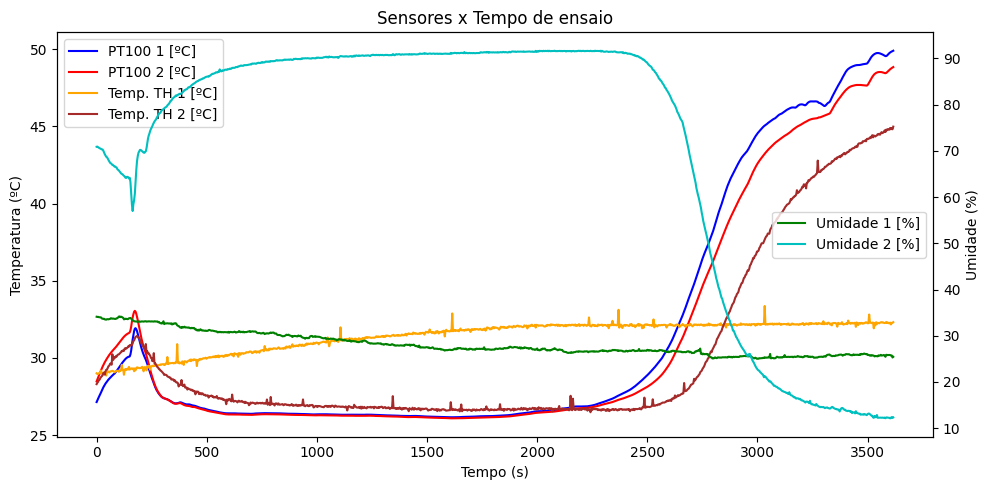

In [ ]:
# Graphic of real time data variables per time in a test
essay_number = 5
mask = ( df_essays['Ensaio'] == essay_number )
df_test = df_essays[mask]
df_columns = df_essays.drop(columns=['Time', 'Ensaio']).columns

fig, ax1 = plt.subplots(figsize=(10, 5))
ax2 = ax1.twinx()

trigger = False
color = ['b', 'r', 'orange', 'green', 'brown', 'c']

for i, column in enumerate(df_columns):
    if ('ºC' in column):
        ax1.plot(df_test.Time, df_test[column], label=column, color=color[i])
    elif('%' in column):
        ax2.plot(df_test.Time, df_test[column], label=column, color=color[i])

ax1.set_xlabel('Tempo (s)')
ax1.set_ylabel('Temperatura (ºC)')
ax2.set_ylabel('Umidade (%)')

# ax1.set_yticks(np.linspace(10, 90, 9))

ax1.legend(loc='upper left')
ax2.legend(loc='center right')
plt.title("Sensores x Tempo de ensaio")
plt.tight_layout()
plt.show()

In [ ]:
df_test.head()

,Time,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],Ensaio
5790,0.000,27.143456,28.480464,29.006837,34.106580,28.304104,70.879686,5
5791,3.277,27.252007,28.604511,28.960864,34.054039,28.389483,70.919094,5
5792,6.730,27.364658,28.732819,28.960864,34.093444,28.455159,70.787732,5
5793,10.038,27.465968,28.852148,28.993702,34.017917,28.560240,70.662938,5
5794,13.385,27.563185,28.969746,29.049526,34.001498,28.589794,70.580837,5


In [ ]:
df_measures

,Time,Umidade Média Produto [%],Umidade 0 Produto [%],Umidade 1 Produto [%],Umidade 2 Produto [%],Ensaio
0,0.000,55.223333,44.55,59.48,61.64,0
1,899.564,48.006667,48.18,48.39,47.45,0
2,1798.938,41.003333,41.39,39.94,41.68,0
3,2700.298,7.083333,7.61,6.74,6.90,0
4,3601.595,2.283333,2.44,2.32,2.09,0
...,...,...,...,...,...,...
80,0.000,60.726667,60.50,61.35,60.33,16
81,901.487,47.770000,47.57,47.79,47.95,16
82,1799.483,29.630000,29.62,29.67,29.60,16
83,2699.369,2.153333,2.06,2.18,2.22,16


,Time,Umidade Média Produto [%],Umidade 0 Produto [%],Umidade 1 Produto [%],Umidade 2 Produto [%],Ensaio,Error
0,0.000,59.280000,59.68,59.27,58.89,5,0.79
1,898.795,47.513333,47.50,47.35,47.69,5,0.34
2,1800.115,30.583333,30.73,30.63,30.39,5,0.34
3,2698.281,5.256667,5.23,5.22,5.32,5,0.10
4,3598.803,2.146667,2.22,2.24,1.98,5,0.26


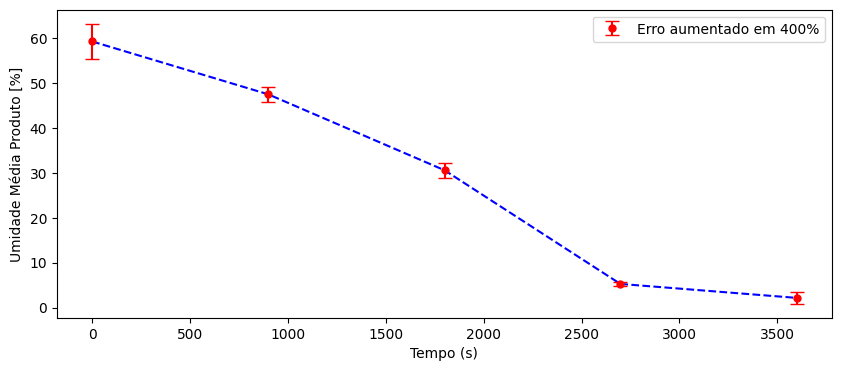

In [ ]:
#Graphic of humidity per time in a test
mask = ( df_measures['Ensaio'] == essay_number )
df_test = df_measures[mask].reset_index(drop=True)
df_test['Error'] = df_test[
    ['Umidade 0 Produto [%]', 'Umidade 1 Produto [%]', 'Umidade 2 Produto [%]']
].apply(lambda row : row.max() - row.min(), axis=1)

display(df_test)

error_factor = 5

plt.figure(figsize=(10, 4))
plt.plot(df_test.Time, df_test[target_col], '--b')
plt.errorbar(df_test.Time,
             df_test[target_col],
             yerr=df_test.Error*error_factor,
             fmt='o', color='r', label=f'Erro aumentado em {(error_factor-1)*100}%',
             markersize=5, capsize=5)
plt.xlabel('Tempo (s)')
plt.ylabel(target_col)

plt.legend()
plt.show()

# Criação de dataframes adicionais

### Dataframe sem tempo

In [145]:
df_train_timeless = df_train.copy(deep=True).drop(columns=['Time'])
df_essays_timeless = df_essays.copy(deep=True).drop(columns=['Time'])

### Dataframe T-1

In [146]:
df_train_t1 = pd.DataFrame()
essays = list(df_train['Ensaio'].unique())
for essay in essays:
    mask = (df_train['Ensaio'] == essay)
    df_essay = df_train[mask].copy(deep=True)
    df_columns = set(list(df_essay.columns))
    columns_to_avoid = set(['Ensaio', 'Umidade Média Produto [%]', 'Time'])

    for col in list(df_columns - columns_to_avoid):
        df_essay[f'{col} t-1'] = df_essay[col].shift()
    
    df_essay.dropna(inplace=True)
    df_essay = df_essay.reset_index(drop=True)
    
    df_train_t1 = pd.concat([df_train_t1, df_essay])

df_train_t1 = df_train_t1.reset_index(drop=True)

In [147]:
df_essays_t1 = pd.DataFrame()
essays = list(df_essays['Ensaio'].unique())
for essay in essays:
    mask = (df_essays['Ensaio'] == essay)
    df_essay = df_essays[mask].copy(deep=True)
    df_columns = set(list(df_essay.columns))
    columns_to_avoid = set(['Ensaio', 'Time'])

    for col in list(df_columns - columns_to_avoid):
        df_essay[f'{col} t-1'] = df_essay[col].shift()
    
    df_essay.dropna(inplace=True)
    df_essay = df_essay.reset_index(drop=True)
    
    df_essays_t1 = pd.concat([df_essays_t1, df_essay])

df_essays_t1 = df_essays_t1.reset_index(drop=True)

### Dataframe T-2

In [148]:
df_train_t2 = pd.DataFrame()
essays = list(df_train['Ensaio'].unique())
for essay in essays:
    mask = (df_train['Ensaio'] == essay)
    df_essay = df_train[mask].copy(deep=True)
    df_columns = set(list(df_essay.columns))
    columns_to_avoid = set(['Ensaio', 'Umidade Média Produto [%]', 'Time'])

    for col in list(df_columns - columns_to_avoid):
        df_essay[f'{col} t-1'] = df_essay[col].shift()
        df_essay[f'{col} t-2'] = df_essay[col].shift().shift()
    
    df_essay.dropna(inplace=True)
    df_essay = df_essay.reset_index(drop=True)
    
    df_train_t2 = pd.concat([df_train_t2, df_essay])

df_train_t2 = df_train_t2.reset_index(drop=True)

In [149]:
df_essays_t2 = pd.DataFrame()
essays = list(df_essays['Ensaio'].unique())
for essay in essays:
    mask = (df_essays['Ensaio'] == essay)
    df_essay = df_essays[mask].copy(deep=True)
    df_columns = set(list(df_essay.columns))
    columns_to_avoid = set(['Ensaio', 'Time'])

    for col in list(df_columns - columns_to_avoid):
        df_essay[f'{col} t-1'] = df_essay[col].shift()
        df_essay[f'{col} t-2'] = df_essay[col].shift().shift()
    
    df_essay.dropna(inplace=True)
    df_essay = df_essay.reset_index(drop=True)
    
    df_essays_t2 = pd.concat([df_essays_t2, df_essay])

df_essays_t2 = df_essays_t2.reset_index(drop=True)

# Normalização dos dados

### Função auxiliar

In [155]:
from sklearn.preprocessing import StandardScaler

def init_normalize(dataFrame:pd.DataFrame, columns_to_avoid:list = ['Ensaio', target_col]):
    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(dataFrame.drop(columns=columns_to_avoid))
    df_scaled = pd.DataFrame(df_scaled, columns=dataFrame.drop(columns=columns_to_avoid).columns)
    df_scaled = pd.concat([df_scaled, dataFrame[columns_to_avoid]], axis=1)
    return (df_scaled, scaler)

def normalize(dataFrame:pd.DataFrame, scaler:StandardScaler, columns_to_avoid:list = ['Ensaio']):
    df_scaled = scaler.transform(dataFrame.drop(columns=columns_to_avoid))
    df_scaled = pd.DataFrame(df_scaled, columns=dataFrame.drop(columns=columns_to_avoid).columns)
    df_scaled = pd.concat([df_scaled, dataFrame[columns_to_avoid]], axis=1)
    return df_scaled

### Dataframe normal

In [156]:
df_train_norm, scaler_df_norm = init_normalize(df_train)
df_train_norm.head()

,Time,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],Ensaio,Umidade Média Produto [%]
0,-1.414184,-1.073482,-1.118343,-1.179055,0.752352,-1.058263,0.003619,0,55.223333
1,-0.707457,-0.655458,-0.632846,-0.737353,-0.007215,-0.356589,0.488132,0,48.006667
2,-0.000880,-0.687122,-0.705524,-0.378413,-0.282206,-0.601513,0.671234,0,41.003333
3,0.707258,-0.685869,-0.696482,-0.122028,-0.390390,-0.616958,0.718780,0,7.083333
4,1.415346,1.358640,1.069553,0.054293,-0.598456,0.944158,-1.342225,0,2.283333


In [157]:
df_essays_norm = normalize(df_essays, scaler_df_norm)
df_essays_norm.head()

,Time,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],Ensaio
0,-1.414184,-1.073482,-1.118343,-1.179055,0.752352,-1.058263,0.003619,0
1,-1.411628,-1.073387,-1.118706,-1.242027,0.758139,-1.052747,0.009635,0
2,-1.408955,-1.074146,-1.119430,-1.183553,0.746565,-1.045024,0.033465,0
3,-1.406418,-1.075208,-1.120559,-1.181754,0.723418,-1.036749,0.077704,0
4,-1.403826,-1.077255,-1.122093,-1.230333,0.659009,-1.037853,0.130083,0


### Dataframe sem tempo

In [158]:
df_train_timeless_norm, scaler_df_timeless = init_normalize(df_train_timeless)
df_train_timeless_norm.head()

,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],Ensaio,Umidade Média Produto [%]
0,-1.073482,-1.118343,-1.179055,0.752352,-1.058263,0.003619,0,55.223333
1,-0.655458,-0.632846,-0.737353,-0.007215,-0.356589,0.488132,0,48.006667
2,-0.687122,-0.705524,-0.378413,-0.282206,-0.601513,0.671234,0,41.003333
3,-0.685869,-0.696482,-0.122028,-0.390390,-0.616958,0.718780,0,7.083333
4,1.358640,1.069553,0.054293,-0.598456,0.944158,-1.342225,0,2.283333


In [159]:
columns_to_avoid = ['Ensaio']
df_essays_timeless_norm = normalize(df_essays_timeless, scaler_df_timeless)
df_essays_timeless_norm.head()

,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],Ensaio
0,-1.073482,-1.118343,-1.179055,0.752352,-1.058263,0.003619,0
1,-1.073387,-1.118706,-1.242027,0.758139,-1.052747,0.009635,0
2,-1.074146,-1.119430,-1.183553,0.746565,-1.045024,0.033465,0
3,-1.075208,-1.120559,-1.181754,0.723418,-1.036749,0.077704,0
4,-1.077255,-1.122093,-1.230333,0.659009,-1.037853,0.130083,0


### Dataframe T-1

In [160]:
df_train_t1_norm, scaler_df_t1 = init_normalize(df_train_t1)
df_train_t1_norm.head()

,Time,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],PT100 2 [ºC] t-1,Temp. TH 1 [ºC] t-1,Umidade 2 [%] t-1,Temp. TH 2 [ºC] t-1,PT100 1 [ºC] t-1,Umidade 1 [%] t-1,Ensaio,Umidade Média Produto [%]
0,-1.342046,-0.815284,-0.779366,-0.982181,0.157115,-0.514717,0.532722,-1.321046,-1.096068,-0.939009,-1.622652,-1.144147,0.674861,0,48.006667
1,-0.448307,-0.845935,-0.849450,-0.595298,-0.142976,-0.750398,0.700672,-0.383893,-0.658850,0.087815,0.254501,-0.406283,-0.076186,0,41.003333
2,0.447405,-0.844722,-0.840732,-0.318952,-0.261035,-0.765260,0.744284,-0.524182,-0.303556,0.475860,-0.400731,-0.462174,-0.348092,0,7.083333
3,1.343054,1.134385,0.862285,-0.128904,-0.488092,0.736938,-1.146186,-0.506730,-0.049774,0.576623,-0.442052,-0.459963,-0.455063,0,2.283333
4,-1.343127,-0.840551,-0.818996,-0.282106,-0.131719,-0.708994,0.686388,-0.596582,-0.359655,-1.318522,-0.524694,-0.575148,0.078301,1,51.775000


In [161]:
df_essays_t1_norm = normalize(df_essays_t1, scaler_df_t1)
df_essays_t1_norm.head()

,Time,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],PT100 2 [ºC] t-1,Temp. TH 1 [ºC] t-1,Umidade 2 [%] t-1,Temp. TH 2 [ºC] t-1,PT100 1 [ºC] t-1,Umidade 1 [%] t-1,Ensaio
0,-2.232741,-1.219843,-1.247889,-1.526145,0.992328,-1.184601,0.093817,-1.321046,-1.096068,-0.939009,-1.622652,-1.144147,0.674861,0
1,-2.229360,-1.220578,-1.248587,-1.463119,0.979698,-1.177170,0.115675,-1.321745,-1.158400,-0.926258,-1.607895,-1.143979,0.680583,0
2,-2.226151,-1.221606,-1.249676,-1.461180,0.954438,-1.169208,0.156253,-1.323143,-1.100520,-0.875756,-1.587234,-1.145318,0.669139,0
3,-2.222872,-1.223588,-1.251155,-1.513540,0.884150,-1.170270,0.204298,-1.325323,-1.098739,-0.782001,-1.565098,-1.147193,0.646252,0
4,-2.219420,-1.226305,-1.253394,-1.319614,0.823746,-1.170800,0.246500,-1.328283,-1.146824,-0.670995,-1.568050,-1.150808,0.582565,0


### Dataframe T-2

In [162]:
df_train_t2_norm, scaler_df_t2 = init_normalize(df_train_t2)
df_train_t2_norm.head()

,Time,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],PT100 2 [ºC] t-1,PT100 2 [ºC] t-2,Temp. TH 1 [ºC] t-1,...,Umidade 2 [%] t-1,Umidade 2 [%] t-2,Temp. TH 2 [ºC] t-1,Temp. TH 2 [ºC] t-2,PT100 1 [ºC] t-1,PT100 1 [ºC] t-2,Umidade 1 [%] t-1,Umidade 1 [%] t-2,Ensaio,Umidade Média Produto [%]
0,-1.226179,-1.047560,-1.028659,-0.735284,-0.041838,-0.868254,0.842923,-0.527442,-2.137285,-0.936283,...,0.030938,-2.327741,0.021158,-2.300614,-0.554201,-2.366404,0.110353,0.553900,0,41.003333
1,0.000278,-1.046395,-1.020359,-0.450144,-0.162634,-0.881963,0.883510,-0.660528,-0.059532,-0.551564,...,0.383592,-0.217698,-0.630680,0.819195,-0.606206,-0.041032,-0.189344,-0.179369,0,7.083333
2,1.226648,0.855051,0.600889,-0.254047,-0.394956,0.503665,-0.875824,-0.643971,-0.370566,-0.276765,...,0.475165,0.579703,-0.671787,-0.269795,-0.604148,-0.217172,-0.307248,-0.444839,0,2.283333
3,-1.223173,-1.047878,-1.005442,0.021089,-0.349727,-0.853565,0.858332,-0.602696,-0.531082,-0.240125,...,0.353598,-3.107611,-0.516168,-0.475820,-0.597071,-0.573207,-0.178102,-0.028539,1,35.256667
4,0.001618,-0.690006,-0.778658,0.200177,-0.506762,-0.891756,0.865180,-0.614216,-0.235408,0.177376,...,0.418358,0.511882,-0.586637,-0.078486,-0.606767,-0.186232,-0.489863,-0.434880,1,4.863333


In [163]:
df_essays_t2_norm = normalize(df_essays_t2, scaler_df_t2)
df_essays_t2_norm.head()

,Time,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],PT100 2 [ºC] t-1,PT100 2 [ºC] t-2,Temp. TH 1 [ºC] t-1,Temp. TH 1 [ºC] t-2,Umidade 2 [%] t-1,Umidade 2 [%] t-2,Temp. TH 2 [ºC] t-1,Temp. TH 2 [ºC] t-2,PT100 1 [ºC] t-1,PT100 1 [ºC] t-2,Umidade 1 [%] t-1,Umidade 1 [%] t-2,Ensaio
0,-3.664891,-1.407502,-1.408632,-1.630726,1.106865,-1.261909,0.298505,-1.417135,-2.137285,-1.477203,-0.956759,-0.890649,-2.327741,-1.831589,-2.300614,-1.240604,-2.366404,0.944471,0.553900,0
1,-3.660497,-1.408490,-1.409669,-1.628724,1.081020,-1.254565,0.336269,-1.418461,-2.138835,-1.414530,-1.018698,-0.844752,-2.301539,-1.811035,-2.276087,-1.241850,-2.365877,0.931857,0.559486,0
2,-3.656007,-1.410395,-1.411077,-1.682751,1.009102,-1.255544,0.380981,-1.420529,-2.141934,-1.412601,-0.961183,-0.759548,-2.197761,-1.789014,-2.241750,-1.243594,-2.370097,0.906631,0.548314,0
3,-3.651280,-1.413005,-1.413208,-1.482653,0.947298,-1.256033,0.420255,-1.423337,-2.146766,-1.464669,-0.959413,-0.658666,-2.005102,-1.791950,-2.204959,-1.246957,-2.376004,0.836435,0.525968,0
4,-3.646627,-1.415474,-1.415594,-1.628724,0.892236,-1.255054,0.451172,-1.427589,-2.153331,-1.271827,-1.007195,-0.570053,-1.776994,-1.793418,-2.209865,-1.251567,-2.387396,0.776110,0.463789,0


# Treinamento de modelos

### Importação de modelos

In [164]:
# Linear Regression
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import Lars
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import TheilSenRegressor
from sklearn.linear_model import HuberRegressor
from sklearn.linear_model import PoissonRegressor

# Support Vector Machine
from sklearn.svm import SVR
from sklearn.svm import NuSVR

# Nearest Neighbors
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neighbors import RadiusNeighborsRegressor

# Gaussian Process Regression
from sklearn.gaussian_process import GaussianProcessRegressor

# Decision Trees
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import ExtraTreeRegressor

# Ensemble Methods
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import HistGradientBoostingRegressor

# Neural Network
from sklearn.neural_network import MLPRegressor

### Treinamento

In [198]:
dfs = {
    'standard': {
        'df': df_train,
        'essays': df_essays,
        'essays_norm': df_essays_norm,
        'scaler': scaler_df_norm,
        'train_norm': df_train_norm
    },
    'timeless': {
        'df': df_train_timeless,
        'essays': df_essays_timeless,
        'essays_norm': df_essays_timeless_norm,
        'scaler': scaler_df_timeless,
        'train_norm': df_train_timeless_norm
    },
    't-1': {
        'df': df_train_t1,
        'essays': df_essays_t1,
        'essays_norm': df_essays_t1_norm,
        'scaler': scaler_df_t1,
        'train_norm': df_train_t1_norm
    },
    't-2': {
        'df': df_train_t2,
        'essays': df_essays_t2,
        'essays_norm': df_essays_t2_norm,
        'scaler': scaler_df_t2,
        'train_norm': df_train_t2_norm
    }
}

### Cross validation

In [166]:
from sklearn.model_selection import cross_val_score
from json import dumps

def run_cross_validation(dataFrame:pd.DataFrame, verbose=True):
    
    base_models = [
      LinearRegression(),
      Ridge(max_iter=1000),
      Lasso(max_iter=1000),
      Lars(),
      ElasticNet(max_iter=1000),
      BayesianRidge(),
      SGDRegressor(max_iter=1000),
      TheilSenRegressor(max_iter=1000),
      HuberRegressor(max_iter=1000),
      PoissonRegressor(max_iter=1000),
      SVR(max_iter=1000),
      NuSVR(max_iter=1000),
      KNeighborsRegressor(n_neighbors=5),
      RadiusNeighborsRegressor(radius=5),
      GaussianProcessRegressor(),
      DecisionTreeRegressor(),
      ExtraTreeRegressor(),
      BaggingRegressor(),
      AdaBoostRegressor(),
      ExtraTreesRegressor(),
      RandomForestRegressor(),
      GradientBoostingRegressor(),
      HistGradientBoostingRegressor(),
      MLPRegressor(hidden_layer_sizes=[20, 20, 20],
        activation='tanh',
        max_iter=10000),
    ]

    best_score = 0
    best_model = None

    results = {}

    X_train = dataFrame.drop(columns=[target_col])
    y_train = dataFrame[target_col]

    cv = 17
    for estimator in base_models:

      model = estimator
      model_name = model.__class__.__name__
      
      scores = cross_val_score(model, X_train, y_train, cv=cv)

      results[model_name] = f'{scores.mean():.3f} +/- {scores.std():.3f}'

      if scores.mean() > best_score:
        best_score = scores.mean()
        best_model = model

    if (verbose):
      print(f'Best model: {best_model} - score: {best_score}')

    return results

In [167]:
results = {}
for key in dfs.keys():
    types_dfs = dfs[key].keys()
    for _type in types_dfs:
        if (_type == 'train_norm'):
            print(f'For {key} dataset, ', end='')
            result = run_cross_validation(df_train_norm)
            results[key] = result

For standard dataset, 

Best model: BaggingRegressor() - score: 0.9801947803858235
For timeless dataset, Best model: RandomForestRegressor() - score: 0.9807015134045659
For t-1 dataset, Best model: RandomForestRegressor() - score: 0.9808747244745608
For t-2 dataset, Best model: RandomForestRegressor() - score: 0.981103206449986


In [168]:
sorted_results = {}
for key in results.keys():
    df_type = results[key]
    sorted_scores = dict(sorted(df_type.items(), key=lambda item: item[1].split(' ')[0]))
    sorted_results[key] = sorted_scores
with open('result-cross-validation.json', 'w') as outfile:
    outfile.write(dumps(sorted_results))

In [ ]:
print('Resultados cross validation')
cv_results = pd.DataFrame(sorted_results)
display(cv_results)

### Modelos interessantes


    Lasso
    SGDRegressor
    HuberRegressor
    LinearRegression
    Lars
    TheilSenRegressor
    BayesianRidge
    Ridge - ok
    AdaBoostRegressor
    RandomForestRegressor
    BaggingRegressor

### Gridsearch nos modelos interessantes

#### Função auxiliar

In [170]:
from sklearn.model_selection import RandomizedSearchCV

def train(base_estimator,
          dataFrame_norm:pd.DataFrame,
          param_grid:dict,
          columns_to_drop:list = ['Ensaio', target_col],
          cv=17,
          verbose=True):
    
    X_train = dataFrame_norm.drop(columns=columns_to_drop)
    y_train = dataFrame_norm[target_col]

    clf = RandomizedSearchCV(base_estimator, param_grid, cv=cv)
    clf.fit(X_train, y_train)

    if (verbose):
        print(f'Best estimator: {clf.best_estimator_}\nScore: {clf.best_score_*100:.2f}%')
        # plot_essay_predictions(clf)
        
    return clf

In [268]:
import matplotlib.pyplot as plt

def plot_essay_predictions(key:str, trained_model:RandomizedSearchCV, dfs:dict=dfs):
    print(f'{key.capitalize()} dataframe\n')
    print(f'Best model: {trained_model.best_estimator_}')
    print(f'Score: {trained_model.best_score_*100:.2f}%\n')

    current_data = dfs[key]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

    # Figure 1
    ax1.set_title('Predição de todos os ensaios x tempo de secagem')

    essays = list(current_data['essays']['Ensaio'].unique())
    for essay in essays:
        df_essays = current_data['essays']
        df_case = df_essays[df_essays['Ensaio'] == essay].copy(deep=True)

        df_essays_norm = current_data['essays_norm']
        df_case_norm = df_essays_norm[df_essays_norm['Ensaio'] == essay]

        y_pred = trained_model.predict(df_case_norm.drop(columns=['Ensaio']))

        if (key == 'timeless'):
            time_df = dfs['standard']['df']
            time_column = time_df[time_df['Ensaio'] == essay]['Time']
            df_case['Time'] = time_column

        ax1.plot(df_case['Time'], y_pred, label =f'Ensaio {essay}', linewidth=3)
    
    ax1.set_xlabel('Tempo de secagem (s)')
    ax1.set_ylabel('Umidade prevista (%)')
    ax1.legend()

    # Figure 2
    ax2.set_title(f'Predição do {essay_number}º ensaio x tempo de secagem')

    df_essays = current_data['essays']
    df_case = df_essays[df_essays['Ensaio'] == essay_number].copy(deep=True)

    df_essays_norm = current_data['essays_norm']
    df_case_norm = df_essays_norm[df_essays_norm['Ensaio'] == essay_number]

    y_pred = trained_model.predict(df_case_norm.drop(columns=['Ensaio']))

    if (key == 'timeless'):
            time_df = dfs['standard']['essays']
            time_column = time_df[time_df['Ensaio'] == essay_number]['Time']
            df_case['Time'] = time_column
            
    ax2.plot(df_case['Time'], y_pred, linewidth=3, label='Valores previstos', color='b')

    df_train = current_data['df'][current_data['df']['Ensaio'] == essay_number].copy(deep=True)

    if (key == 'timeless'):
            time_df = dfs['standard']['df']
            time_column = time_df[time_df['Ensaio'] == essay_number]['Time']
            df_train['Time'] = time_column

    ax2.scatter(df_train['Time'], df_train[target_col], label='Valores reais', color='r')

    ax2.set_xlabel('Tempo de secagem (s)')
    ax2.set_ylabel('Umidade prevista (%)')
    ax2.legend()

    plt.tight_layout()
    plt.show()

#### Huber Regressor

In [244]:
from sklearn.linear_model import HuberRegressor
HuberRegressor().get_params()

{'alpha': 0.0001,
 'epsilon': 1.35,
 'fit_intercept': True,
 'max_iter': 100,
 'tol': 1e-05,
 'warm_start': False}

Best estimator: HuberRegressor(alpha=0.001, max_iter=1000, tol=0.0001, warm_start=True)
Score: 96.13%
Standard dataframe

Best model: HuberRegressor(alpha=0.001, max_iter=1000, tol=0.0001, warm_start=True)
Score: 96.13%



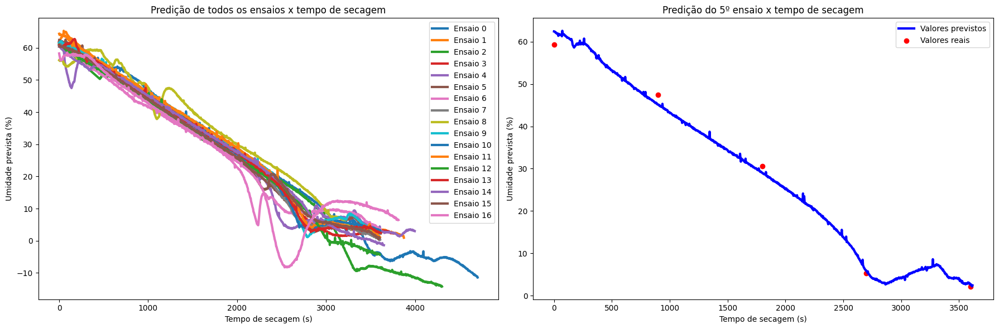

Best estimator: HuberRegressor(alpha=0.001, max_iter=1000, tol=0.0001, warm_start=True)
Score: 67.36%
Timeless dataframe

Best model: HuberRegressor(alpha=0.001, max_iter=1000, tol=0.0001, warm_start=True)
Score: 67.36%



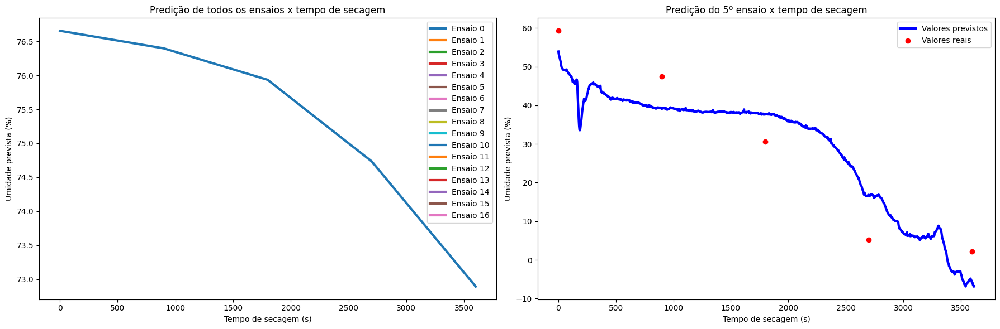

Best estimator: HuberRegressor(alpha=0.001, max_iter=1000, tol=1e-06, warm_start=True)
Score: 94.92%
T-1 dataframe

Best model: HuberRegressor(alpha=0.001, max_iter=1000, tol=1e-06, warm_start=True)
Score: 94.92%



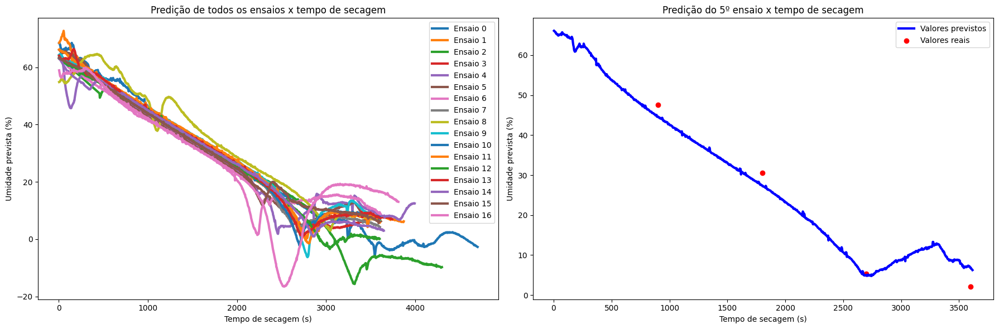

Best estimator: HuberRegressor(alpha=0.001, max_iter=1000, tol=1e-06, warm_start=True)
Score: 81.61%
T-2 dataframe

Best model: HuberRegressor(alpha=0.001, max_iter=1000, tol=1e-06, warm_start=True)
Score: 81.61%



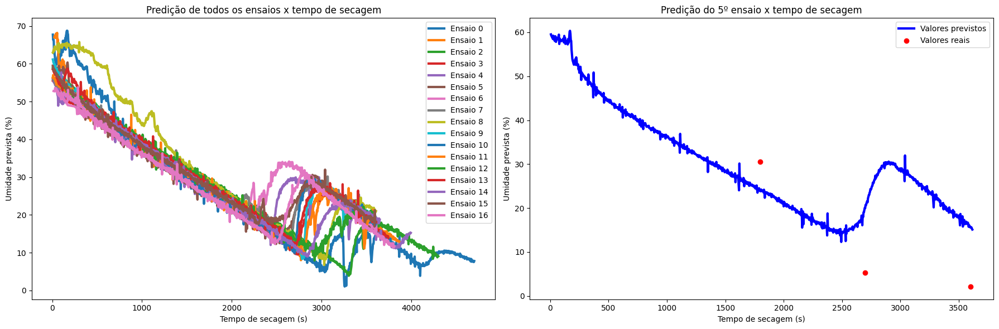

In [278]:
from sklearn.linear_model import HuberRegressor

base_estimator = HuberRegressor(max_iter=1000)
param_grid = {
    'alpha': [0.00001, 0.0001, 0.001],
    'fit_intercept': [True, False],
    'tol': [1e-06, 1e-05, 1e-04],
    'warm_start': [True, False]
}

for key in dfs.keys():
    types_dfs = dfs[key].keys()
    trained_model = train(base_estimator, dfs[key]['train_norm'], param_grid)
    plot_essay_predictions(key, trained_model)

# persist_instance(trained_model, base_estimator.__class__.__name__)

#### Ridge

In [80]:
from sklearn.linear_model import Ridge
Ridge().get_params()

{'alpha': 1.0,
 'copy_X': True,
 'fit_intercept': True,
 'max_iter': None,
 'positive': False,
 'random_state': None,
 'solver': 'auto',
 'tol': 0.0001}

Best estimator: Ridge(alpha=0.1, max_iter=1000, random_state=1, tol=0.001)
Score: 68.12%


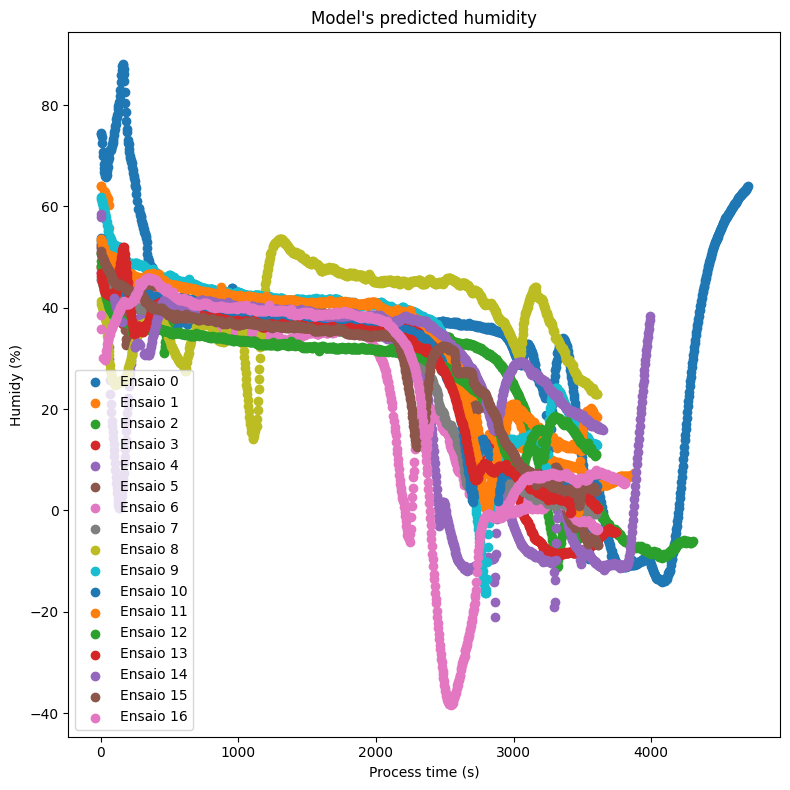

RandomizedSearchCV(cv=17, estimator=Ridge(max_iter=1000, random_state=1),
                   param_distributions={'alpha': [0.1, 1.0, 10],
                                        'copy_X': [True, False],
                                        'fit_intercept': [True, False],
                                        'positive': [True, False],
                                        'tol': [1e-05, 0.0001, 0.001]})

In [81]:
from sklearn.linear_model import Ridge

base_estimator = Ridge(max_iter=1000, random_state=1)
param_grid = {
    'alpha': [0.1, 1.0, 10],
    'copy_X': [True, False],
    'fit_intercept': [True, False],
    'positive': [True, False],
    'tol': [0.00001, 0.0001, 0.001]
}

trained_model = train(base_estimator, param_grid)
persist_instance(trained_model, base_estimator.__class__.__name__)

#### Linear Regression

In [82]:
from sklearn.linear_model import LinearRegression
LinearRegression().get_params()

{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}

Best estimator: LinearRegression(copy_X=False, n_jobs=True)
Score: 67.46%


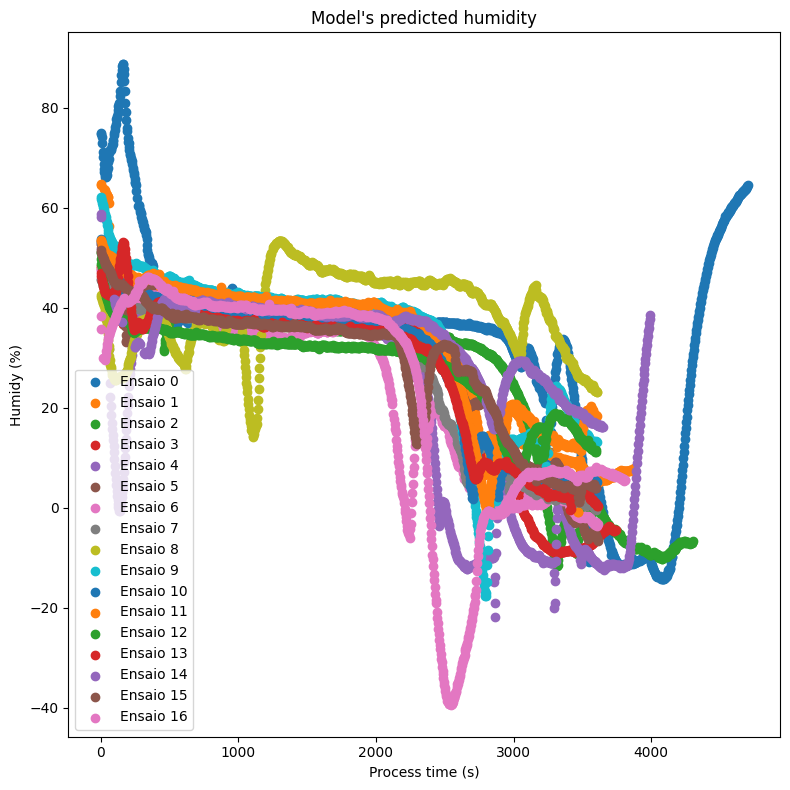

RandomizedSearchCV(cv=17, estimator=LinearRegression(),
                   param_distributions={'copy_X': [True, False],
                                        'fit_intercept': [True, False],
                                        'n_jobs': [None, 2, True],
                                        'positive': [True, False]})

In [83]:
from sklearn.linear_model import LinearRegression

base_estimator = LinearRegression()
param_grid = {
    'copy_X': [True, False],
    'fit_intercept': [True, False],
    'n_jobs': [None, 2, True],
    'positive': [True, False]
}

trained_model = train(base_estimator, param_grid)
persist_instance(trained_model, base_estimator.__class__.__name__)

#### BayesianRidge

In [84]:
from sklearn.linear_model import BayesianRidge
BayesianRidge().get_params()

{'alpha_1': 1e-06,
 'alpha_2': 1e-06,
 'alpha_init': None,
 'compute_score': False,
 'copy_X': True,
 'fit_intercept': True,
 'lambda_1': 1e-06,
 'lambda_2': 1e-06,
 'lambda_init': None,
 'n_iter': 300,
 'tol': 0.001,
 'verbose': False}

Best estimator: BayesianRidge(alpha_1=1e-07, compute_score=True, copy_X=False, lambda_2=1e-07,
              lambda_init=10, tol=0.01)
Score: 68.63%


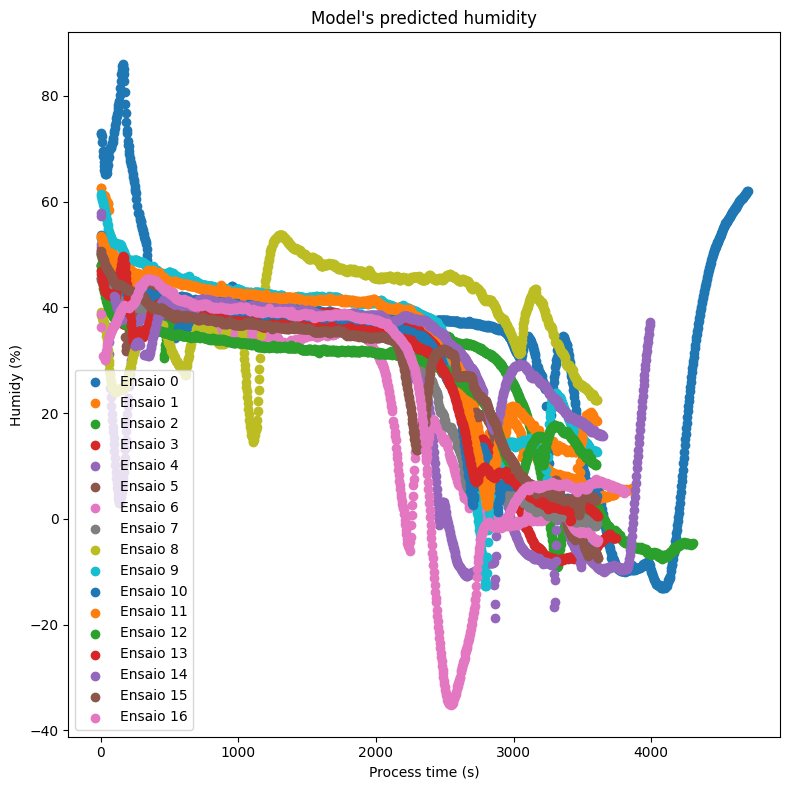

RandomizedSearchCV(cv=17, estimator=BayesianRidge(),
                   param_distributions={'alpha_1': [1e-07, 1e-06, 1e-05],
                                        'alpha_2': [1e-07, 1e-06, 1e-05],
                                        'compute_score': [True, False],
                                        'copy_X': [True, False],
                                        'fit_intercept': [True, False],
                                        'lambda_1': [1e-07, 1e-06, 1e-05],
                                        'lambda_2': [1e-07, 1e-06, 1e-05],
                                        'lambda_init': [0.1, 1, 10],
                                        'tol': [0.0001, 0.001, 0.01]})

In [85]:
from sklearn.linear_model import BayesianRidge

base_estimator = BayesianRidge()
param_grid = {
    'alpha_1': [1e-07, 1e-06, 1e-05],
    'alpha_2': [1e-07, 1e-06, 1e-05],
    'compute_score': [True, False],
    'copy_X': [True, False],
    'fit_intercept': [True, False],
    'lambda_1': [1e-07, 1e-06, 1e-05],
    'lambda_2': [1e-07, 1e-06, 1e-05],
    'lambda_init': [0.1, 1, 10],
    'tol': [0.0001, 0.001, 0.01],
}

trained_model = train(base_estimator, param_grid)
persist_instance(trained_model, base_estimator.__class__.__name__)

#### TheilSenRegressor

In [86]:
from sklearn.linear_model import TheilSenRegressor
TheilSenRegressor().get_params()

{'copy_X': True,
 'fit_intercept': True,
 'max_iter': 300,
 'max_subpopulation': 10000.0,
 'n_jobs': None,
 'n_subsamples': None,
 'random_state': None,
 'tol': 0.001,
 'verbose': False}

Best estimator: TheilSenRegressor(copy_X=False, max_iter=1000, max_subpopulation=1000.0,
                  n_jobs=-1, random_state=1, tol=0.01)
Score: 55.49%


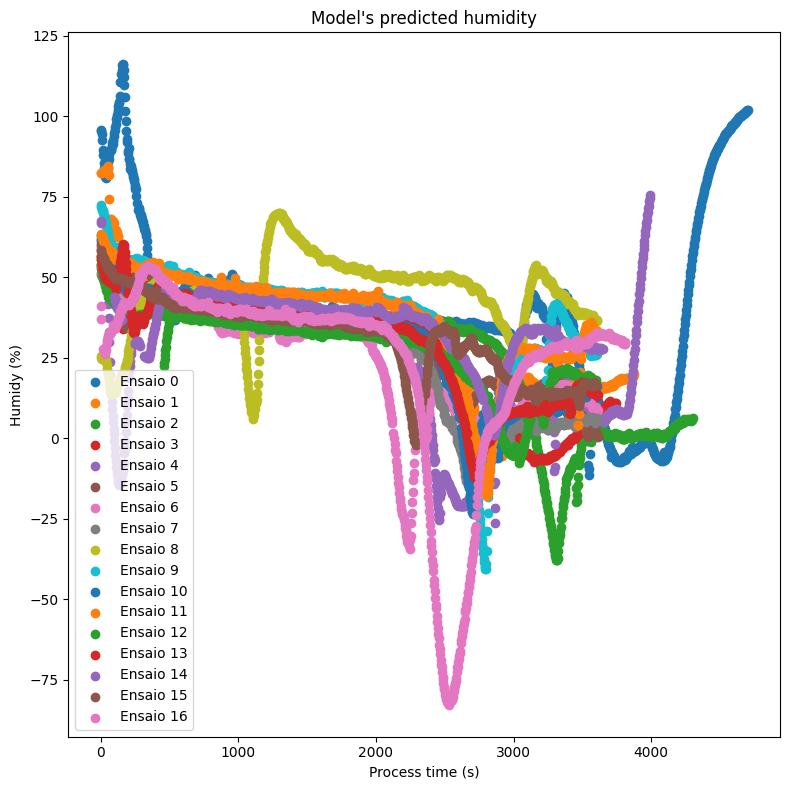

RandomizedSearchCV(cv=17,
                   estimator=TheilSenRegressor(max_iter=1000, n_jobs=-1,
                                               random_state=1),
                   param_distributions={'copy_X': [True, False],
                                        'fit_intercept': [True, False],
                                        'max_subpopulation': [1000.0, 10000.0,
                                                              100000.0],
                                        'tol': [0.0001, 0.001, 0.01]})

In [87]:
from sklearn.linear_model import TheilSenRegressor

base_estimator = TheilSenRegressor(max_iter=1000, random_state=1, n_jobs=-1)
param_grid = {
    'copy_X': [True, False],
    'fit_intercept': [True, False],
    'max_subpopulation': [1000.0, 10000.0, 100000.0],
    'tol': [0.0001, 0.001, 0.01]
}

trained_model = train(base_estimator, param_grid)
persist_instance(trained_model, base_estimator.__class__.__name__)

#### Lars

In [88]:
from sklearn.linear_model import Lars
Lars().get_params()

{'copy_X': True,
 'eps': 2.220446049250313e-16,
 'fit_intercept': True,
 'fit_path': True,
 'jitter': None,
 'n_nonzero_coefs': 500,
 'normalize': 'deprecated',
 'precompute': 'auto',
 'random_state': None,
 'verbose': False}

Best estimator: Lars(n_nonzero_coefs=1000, random_state=1)
Score: 66.80%


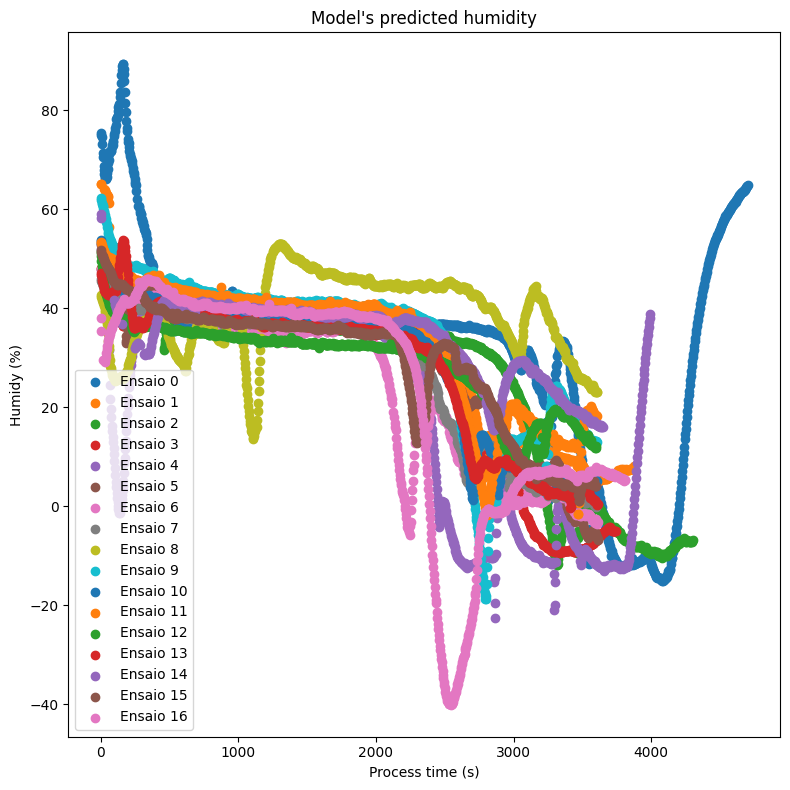

RandomizedSearchCV(cv=17, estimator=Lars(random_state=1),
                   param_distributions={'copy_X': [True, False],
                                        'fit_intercept': [True, False],
                                        'fit_path': [True, False],
                                        'n_nonzero_coefs': [250, 500, 1000]})

In [89]:
from sklearn.linear_model import Lars

base_estimator = Lars(random_state=1)
param_grid = {
    'copy_X': [True, False],
    'fit_intercept': [True, False],
    'fit_path': [True, False],
    'n_nonzero_coefs': [250, 500, 1000]
}

trained_model = train(base_estimator, param_grid)
persist_instance(trained_model, base_estimator.__class__.__name__)

#### SGDRegressor

In [90]:
from sklearn.linear_model import SGDRegressor
SGDRegressor().get_params()

{'alpha': 0.0001,
 'average': False,
 'early_stopping': False,
 'epsilon': 0.1,
 'eta0': 0.01,
 'fit_intercept': True,
 'l1_ratio': 0.15,
 'learning_rate': 'invscaling',
 'loss': 'squared_error',
 'max_iter': 1000,
 'n_iter_no_change': 5,
 'penalty': 'l2',
 'power_t': 0.25,
 'random_state': None,
 'shuffle': True,
 'tol': 0.001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

c:\Users\rapha\OneDrive\Documentos\GitHub\projects-tcc-imt-2023\.venv-tcc\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1548: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
c:\Users\rapha\OneDrive\Documentos\GitHub\projects-tcc-imt-2023\.venv-tcc\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1548: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
c:\Users\rapha\OneDrive\Documentos\GitHub\projects-tcc-imt-2023\.venv-tcc\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1548: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
c:\Users\rapha\OneDrive\Documentos\GitHub\projects-tcc-imt-2023\.venv-tcc\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1548: Co

Best estimator: SGDRegressor(alpha=0.001, epsilon=0.01, l1_ratio=0.2,
             loss='squared_epsilon_insensitive', power_t=0.125, random_state=1,
             tol=0.0001, warm_start=True)
Score: 69.25%


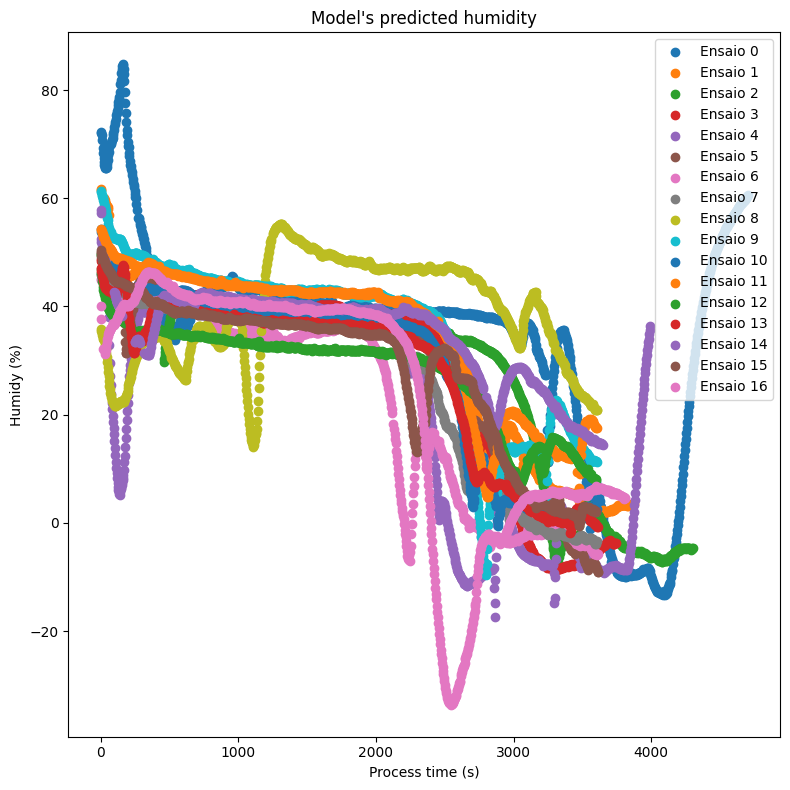

RandomizedSearchCV(cv=17, estimator=SGDRegressor(random_state=1),
                   param_distributions={'alpha': [1e-05, 0.0001, 0.001],
                                        'average': [True, False],
                                        'early_stopping': [True, False],
                                        'epsilon': [0.01, 0.1, 1],
                                        'eta0': [0.001, 0.01, 0.1],
                                        'fit_intercept': [True, False],
                                        'l1_ratio': [0.1, 0.15, 0.2],
                                        'learning_rate': ['constant', 'optimal',
                                                          'invscaling',
                                                          'adaptive'],
                                        'loss': ['squared_error',
                                                 'epsilon_insensitive',
                                                 'squared_epsilon_insensitive',
                                                 'huber'],
                                        'power_t': [0.125, 0.25, 0.5],
                                        'shuffle': [True, False],
                                        'tol': [0.0001, 0.001, 0.01],
                                        'validation_fraction': [0.01, 0.05,
                                                                0.1],
                                        'warm_start': [True, False]})

In [91]:
from sklearn.linear_model import SGDRegressor

base_estimator = SGDRegressor(max_iter=1000, random_state=1)
param_grid = {
    'alpha': [0.00001, 0.0001, 0.001],
    'average': [True, False],
    'early_stopping': [True, False],
    'epsilon': [0.01, 0.1, 1],
    'eta0': [0.001, 0.01, 0.1],
    'fit_intercept': [True, False],
    'l1_ratio': [0.10, 0.15, 0.20],
    'learning_rate': ['constant', 'optimal', 'invscaling', 'adaptive'],
    'loss': ['squared_error', 'epsilon_insensitive', 'squared_epsilon_insensitive', 'huber'],
    'power_t': [0.125, 0.25, 0.50],
    'shuffle': [True, False],
    'tol': [0.0001, 0.001, 0.01],
    'validation_fraction': [0.01, 0.05, 0.1],
    'warm_start': [True, False]
}

trained_model = train(base_estimator, param_grid)
persist_instance(trained_model, base_estimator.__class__.__name__)

#### Lasso

In [92]:
from sklearn.linear_model import Lasso
Lasso().get_params()

{'alpha': 1.0,
 'copy_X': True,
 'fit_intercept': True,
 'max_iter': 1000,
 'positive': False,
 'precompute': False,
 'random_state': None,
 'selection': 'cyclic',
 'tol': 0.0001,
 'warm_start': False}

Best estimator: Lasso(positive=True, random_state=1, selection='random', tol=1e-05,
      warm_start=True)
Score: 37.26%


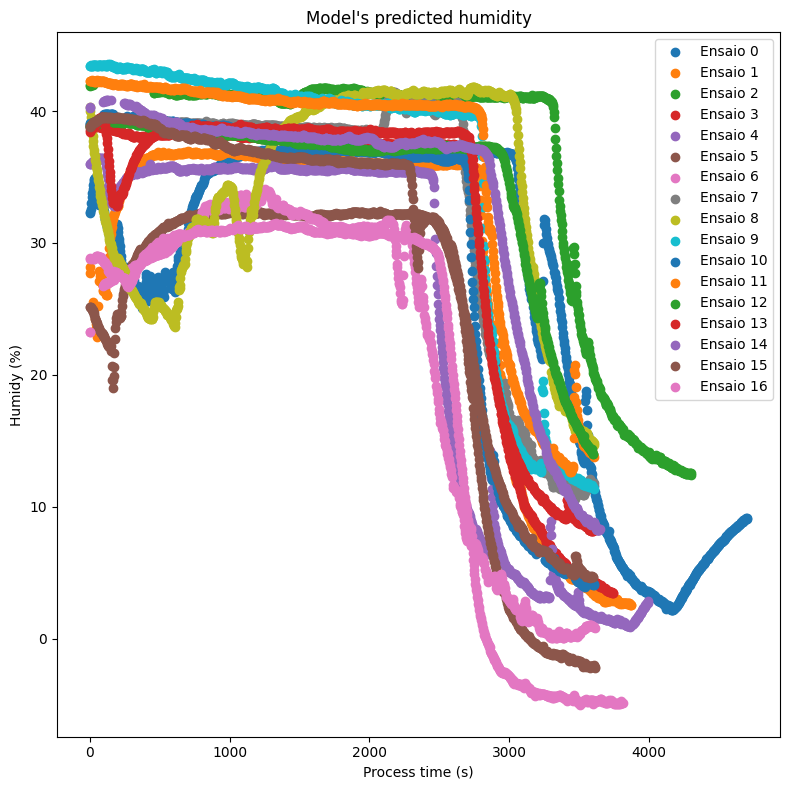

RandomizedSearchCV(cv=17, estimator=Lasso(random_state=1),
                   param_distributions={'alpha': [0.1, 1.0, 10],
                                        'copy_X': [True, False],
                                        'fit_intercept': [True, False],
                                        'positive': [True, False],
                                        'precompute': [True, False],
                                        'selection': ['cyclic', 'random'],
                                        'tol': [1e-05, 0.0001, 0.001],
                                        'warm_start': [True, False]})

In [93]:
from sklearn.linear_model import Lasso

base_estimator = Lasso(max_iter=1000, random_state=1)
param_grid = {
    'alpha': [0.1, 1.0, 10],
    'copy_X': [True, False],
    'fit_intercept': [True, False],
    'positive': [True, False],
    'precompute': [True, False],
    'selection': ['cyclic', 'random'],
    'tol': [0.00001, 0.0001, 0.001],
    'warm_start': [True, False],
}

trained_model = train(base_estimator, param_grid)
persist_instance(trained_model, base_estimator.__class__.__name__)